### Question 1

In [1]:
import cv2 as cv
import matplotlib.pyplot as plt
from matplotlib.patches import Circle
import numpy as np

Text(0.5, 1.0, 'Original Image')

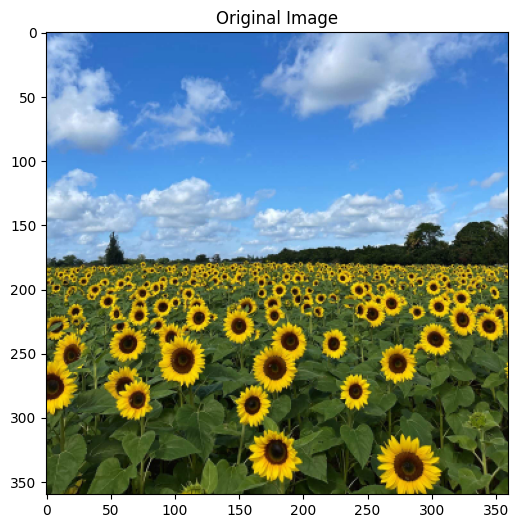

In [2]:
im =cv.imread('images/the_berry_farms_sunflower_field.jpeg', cv.IMREAD_REDUCED_COLOR_4)

fig, ax = plt.subplots(figsize=(10, 6))    

ax.imshow(cv.cvtColor(im, cv.COLOR_BGR2RGB))
ax.set_title('Original Image')

Text(0.5, 1.0, 'LoG Filtered Image (sigma=3.0)')

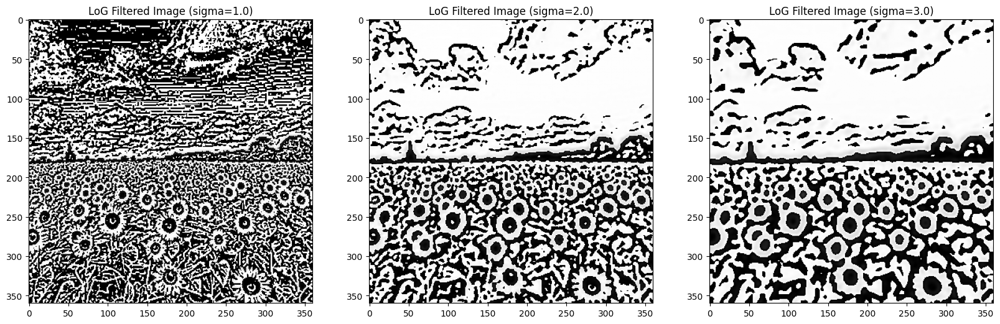

In [3]:
def LoG_filter_opencv(image, sigma, size=None):
    # Generate LoG kernel
    if size is None:
        size = int(6 * sigma + 1) if sigma >= 1 else 7

    if size % 2 == 0:  # Ensure size is odd
        size += 1

    x, y = np.meshgrid(np.arange(-size//2+1, size//2+1),
                       np.arange(-size//2+1, size//2+1))

    kernel = -(1/(np.pi * sigma**4)) * (1 - ((x**2 + y**2) / (2 * sigma**2))) * np.exp(-(x**2 + y**2) / (2 * sigma**2))
    kernel = kernel / np.sum(np.abs(kernel))  # Normalize kernel

    result = cv.filter2D(image.astype(np.float64), cv.CV_64F, kernel)

    return result
#convert to grayscale
gray_im = cv.cvtColor(im, cv.COLOR_RGB2GRAY)

fig, ax = plt.subplots(1,3,figsize=(20, 6))
LoG_image = LoG_filter_opencv(gray_im, sigma=1.0)
LoG_image =LoG_image.astype(np.uint8)
ax[0].imshow(LoG_image, cmap='gray')
ax[0].set_title('LoG Filtered Image (sigma=1.0)')

LoG_image = LoG_filter_opencv(gray_im, sigma=2.0)
LoG_image =LoG_image.astype(np.uint8)
ax[1].imshow(LoG_image, cmap='gray')
ax[1].set_title('LoG Filtered Image (sigma=2.0)')

LoG_image = LoG_filter_opencv(gray_im, sigma=3.0)
LoG_image =LoG_image.astype(np.uint8)
ax[2].imshow(LoG_image, cmap='gray')
ax[2].set_title('LoG Filtered Image (sigma=3.0)')

# Find the largest circle



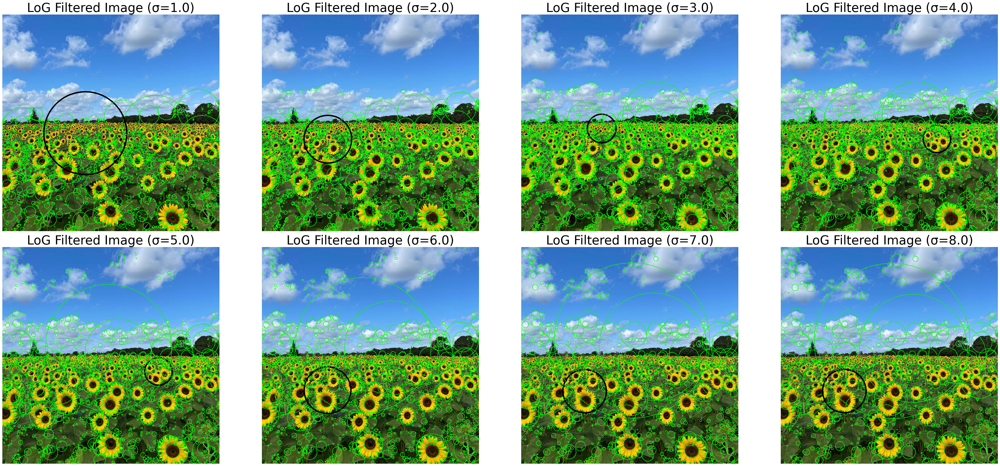


LARGEST CIRCLE DETECTED ACROSS ALL SCALES
Scale (σ):           1.00
Center (x, y):       (550.00, 789.00)
Radius:              275.86 pixels
Area:                33288.50 pixels²
Diameter:            551.72 pixels

Largest circles at each scale:
------------------------------------------------------------
σ=1.0: center=(550.0, 789.0), radius=275.9, area=33288.5
σ=2.0: center=(437.1, 829.6), radius=158.6, area=10835.0
σ=3.0: center=(533.5, 758.5), radius=95.9, area=5636.5
σ=4.0: center=(1035.4, 827.8), radius=91.5, area=11427.0
σ=5.0: center=(1035.6, 827.4), radius=91.5, area=12233.0
σ=6.0: center=(435.0, 952.0), radius=155.0, area=20354.5
σ=7.0: center=(420.7, 958.8), radius=144.9, area=20533.5
σ=8.0: center=(421.1, 957.6), radius=144.1, area=27400.5


In [4]:
import copy
from matplotlib import pyplot as plt
import cv2 as cv
import numpy as np

def drawblobs(gryimage, im):
    # Threshold the image to get binary image
    _, binary = cv.threshold(np.uint8(np.abs(gryimage)), 10, 255, cv.THRESH_BINARY)
    copy_im = copy.deepcopy(im)
    
    # Find contours
    contours, _ = cv.findContours(binary, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    
    # Check if any contours were found
    if len(contours) == 0:
        return copy_im, None
    
    largest = max(contours, key=cv.contourArea)
    largest_area = cv.contourArea(largest)

    for contour in contours:
        if len(contour) >= 5:  # Need at least 5 points to fit ellipse
            (x, y), radius = cv.minEnclosingCircle(contour)
            center = (int(x), int(y))
            radius = int(radius)
            
            # Compare using contour area for consistency
            if cv.contourArea(contour) == largest_area:
                cv.circle(copy_im, center, radius, (0, 0, 0), 8)  # Black for largest
            else:
                cv.circle(copy_im, center, radius, (0, 255, 0), 2)  # Green for others

    return copy_im, largest

im = cv.imread('images/the_berry_farms_sunflower_field.jpeg', cv.IMREAD_COLOR)
gray_im = cv.cvtColor(im, cv.COLOR_BGR2GRAY)

fig, ax = plt.subplots(2, 4, figsize=(45, 20))

# Store information about largest circles at each scale
largest_circles = []

for i, sigma in enumerate(np.arange(1.0, 9.0, 1.0)):

    LoG_image = LoG_filter_opencv(gray_im, sigma=sigma)
    im_copy = im.copy()
    blobImage, largest = drawblobs(LoG_image, im_copy)

    # Store largest circle info if found
    if largest is not None:
        (x, y), radius = cv.minEnclosingCircle(largest)
        area = cv.contourArea(largest)
        largest_circles.append({
            'sigma': sigma,
            'center_x': x,
            'center_y': y,
            'radius': radius,
            'area': area
        })

    ax[i // 4, i % 4].imshow(cv.cvtColor(blobImage, cv.COLOR_BGR2RGB))  
    ax[i // 4, i % 4].set_title(f'LoG Filtered Image (σ={sigma:.1f})', fontsize=38)
    ax[i // 4, i % 4].axis('off')

plt.tight_layout()
plt.show()

if largest_circles:
    overall_largest = max(largest_circles, key=lambda x: x['area'])
    
    print("\n" + "="*60)
    print("LARGEST CIRCLE DETECTED ACROSS ALL SCALES")
    print("="*60)
    print(f"Scale (σ):           {overall_largest['sigma']:.2f}")
    print(f"Center (x, y):       ({overall_largest['center_x']:.2f}, {overall_largest['center_y']:.2f})")
    print(f"Radius:              {overall_largest['radius']:.2f} pixels")
    print(f"Area:                {overall_largest['area']:.2f} pixels²")
    print(f"Diameter:            {2 * overall_largest['radius']:.2f} pixels")
    print("="*60)
    
    print("\n" + "Largest circles at each scale:")
    print("-"*60)
    for info in largest_circles:
        print(f"σ={info['sigma']:.1f}: center=({info['center_x']:.1f}, {info['center_y']:.1f}), "
              f"radius={info['radius']:.1f}, area={info['area']:.1f}")
else:
    print("No circles detected!")


### Question 2

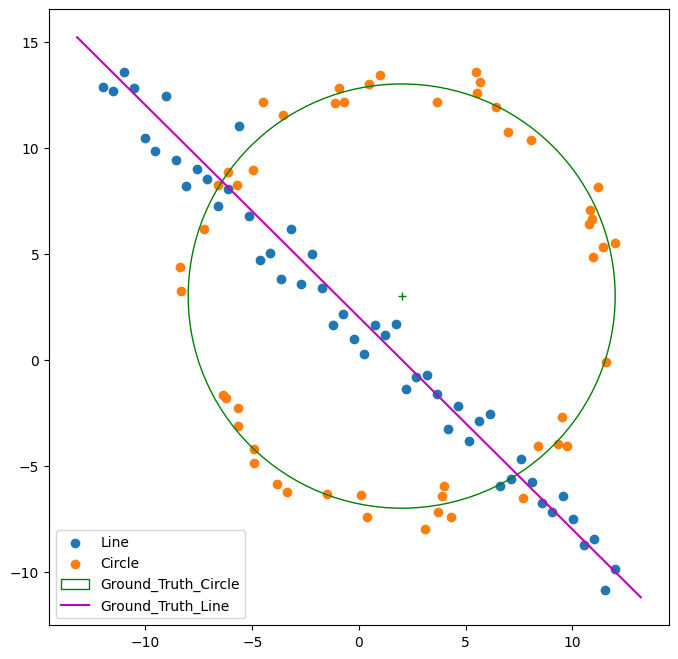

In [5]:
import numpy as np
from scipy.optimize import minimize
from scipy import linalg
import matplotlib.pyplot as plt
#import tikzplotlib

#np.random.seed(0)
N = 100
half_n = N//2
r = 10
# Generating values for circle
x0_gt, y0_gt = 2, 3  # Center
s = r/16
t = np.random.uniform(0, 2*np.pi, half_n)
n = s*np.random.randn(half_n)
x, y = x0_gt + (r + n)*np.cos(t), y0_gt + (r + n)*np.sin(t)
X_circ = np.hstack((x.reshape(half_n, 1), y.reshape(half_n, 1)))

s = 1.
m, b = -1, 2
x = np.linspace(-12, 12, half_n)
y = m*x + b + s*np.random.randn(half_n)
X_line = np.hstack((x.reshape(half_n, 1), y.reshape(half_n, 1)))

X = np.vstack((X_circ, X_line))  # All points

fig, ax = plt.subplots(1, 1, figsize=(8, 8))
ax.scatter(X_line[:, 0], X_line[:, 1], label='Line')
ax.scatter(X_circ[:, 0], X_circ[:, 1], label='Circle')
circle_gt = plt.Circle((x0_gt, y0_gt), r, color='g', fill=False, label='Ground_Truth_Circle')
ax.add_patch(circle_gt)
ax.plot(x0_gt, y0_gt, '+', color='g')
x_min, x_max = ax.get_xlim()
x_ = np.array([x_min, x_max])
y_ = m*x_ + b
plt.plot(x_, y_, color='m', label='Ground_Truth_Line')
plt.legend()
plt.show()


#### Part a.

Max number of Inliers: 49
Estimated Line: y = -0.97x + 1.50
38


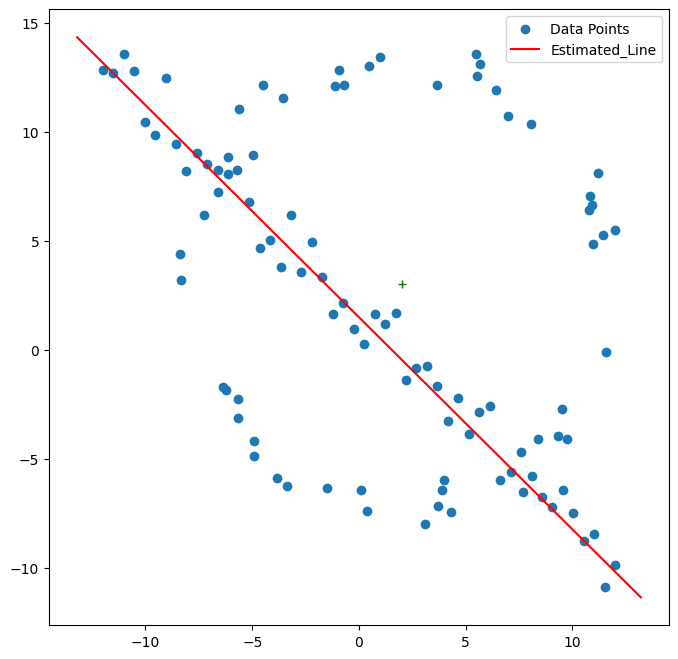

In [6]:
# RANSAC for line fitting 
distance_threshold = 1
num_itterations = 1000

inlier = []
lineparam = []
num_inliers = []
inlierxy=[]

for i in range(num_itterations):

    idx = np.random.choice(X.shape[0], 2, replace=False)

    # compute line parameters
    x1, y1 = X[idx[0]]
    x2, y2 = X[idx[1]]

    if x2 == x1:  
        continue

    m = (y2 - y1) / (x2 - x1)
    b = y1 - m * x1

    inlier = []

    for x, y in X:
        # calculate perpendicular distance to the line
        distance = np.abs(m * x - y + b) / np.sqrt(m**2 + 1)
        if distance < distance_threshold:
            inlier.append([x, y])  

    inlierxy.append(inlier)
    num_inliers.append(len(inlier))
    lineparam.append((m, b))

# find best line with most inliers
best_idx = int(np.argmax(num_inliers))
m, b = lineparam[best_idx]
bestlinefits = inlierxy[best_idx]

print(f"Max number of Inliers: {max(num_inliers)}")
print(f"Estimated Line: y = {m:.2f}x + {b:.2f}")
print(len(inlier))
# visualize
fig, ax = plt.subplots(1, 1, figsize=(8, 8))
ax.scatter(X[:, 0], X[:, 1], label='Data Points')
ax.plot(x0_gt, y0_gt, '+', color='g')
x_min, x_max = ax.get_xlim()
x_ = np.array([x_min, x_max])
y_ = m * x_ + b
plt.plot(x_, y_, color='r', label='Estimated_Line')
plt.legend()
plt.show()


#### part b.

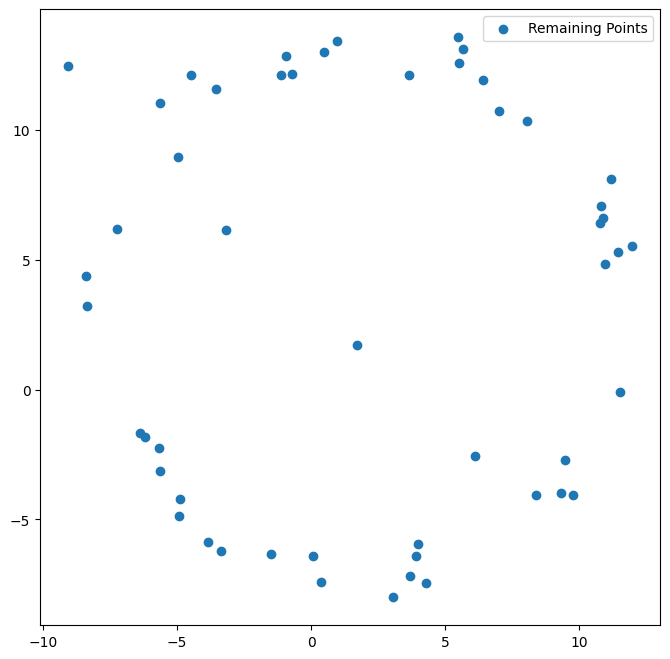

In [7]:
# Get the consensus datapoitns of the fitted line
consensus_points = []
for x, y in X:
    distance = np.abs(m * x - y + b) / np.sqrt(m**2 + 1)
    if distance < distance_threshold:
        consensus_points.append((x, y))

#Remove those points from X
consensus_points = np.array(consensus_points)
X_remaining = np.array([point for point in X if point.tolist() not in consensus_points.tolist()])

# Visualize remaining points
fig, ax = plt.subplots(1, 1, figsize=(8, 8))
ax.scatter(X_remaining[:, 0], X_remaining[:, 1], label='Remaining Points')
plt.legend()

Max Inliers: 45
Estimated Circle: center=(1.64, 3.26), radius=10.09


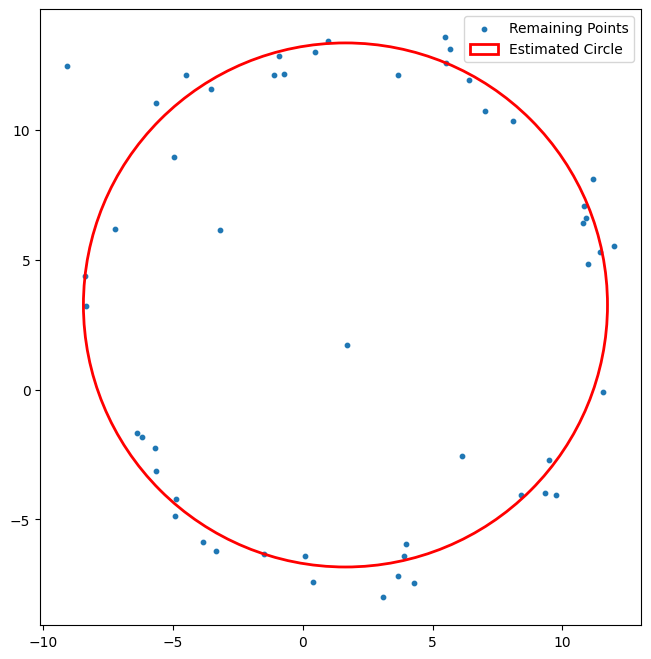

In [8]:
from numpy import c_


c_lineparam = []
c_inliers=[]
num_inliers = []
num_itterations = 10000

X = np.asarray(X)
X_remaining = np.asarray(X_remaining)

for i in range(num_itterations):
    idx = np.random.choice(X.shape[0], 3, replace=False)
    (x1, y1), (x2, y2), (x3, y3) = X[idx]

    if (x2 - x1) == 0 or (x3 - x2) == 0:
        continue

    m1 = (y2 - y1) / (x2 - x1)
    m2 = (y3 - y2) / (x3 - x2)

    if abs(m1 - m2) < 1e-8 or m1 == 0 or m2 == 0:
        continue

    #Finding center    
    m1_chrod = -1.0 / m1
    m2_chrod = -1.0 / m2

    Lxc1, Lyc1 = (x1 + x2) / 2.0, (y1 + y2) / 2.0
    Lxc2, Lyc2 = (x2 + x3) / 2.0, (y2 + y3) / 2.0

    isparallel = (m1_chrod - m2_chrod)
    if abs(isparallel) < 1e-8:
        continue
    denom = (m1_chrod - m2_chrod)
    #center
    xc = ((m1_chrod * Lxc1 - m2_chrod * Lxc2) + (Lyc2 - Lyc1)) / denom
    yc = m1_chrod * (xc - Lxc1) + Lyc1

    r = np.sqrt((xc - x1)**2 + (yc - y1)**2)
    if not (5 < r < 15):
        continue

    dx = X_remaining[:, 0] - xc
    dy = X_remaining[:, 1] - yc
    distances = np.sqrt(dx**2 + dy**2)

    inlier_mask = np.abs(distances - r) < distance_threshold
    c_inliers.append(X_remaining[inlier_mask])
    inlier_count = np.sum(inlier_mask)

    num_inliers.append(inlier_count)
    c_lineparam.append((xc, yc, r))

if len(num_inliers) == 0:
    print("No valid circle found.")
else:
    best_idx = int(np.argmax(num_inliers))
    xc, yc, r = c_lineparam[best_idx]

    print(f"Max Inliers: {max(num_inliers)}")
    print(f"Estimated Circle: center=({xc:.2f}, {yc:.2f}), radius={r:.2f}")

    fig, ax = plt.subplots(1, 1, figsize=(8, 8))
    ax.scatter(X_remaining[:, 0], X_remaining[:, 1], label='Remaining Points', s=10)
    circle_est = plt.Circle((xc, yc), r, color='r', fill=False, lw=2, label='Estimated Circle')
    ax.add_patch(circle_est)
    ax.set_aspect('equal', adjustable='box')
    plt.legend()
    plt.show()


In [9]:
print(len(bestlinefits))
bestlinefits = np.array(bestlinefits,dtype=float)

49


#### Part c.

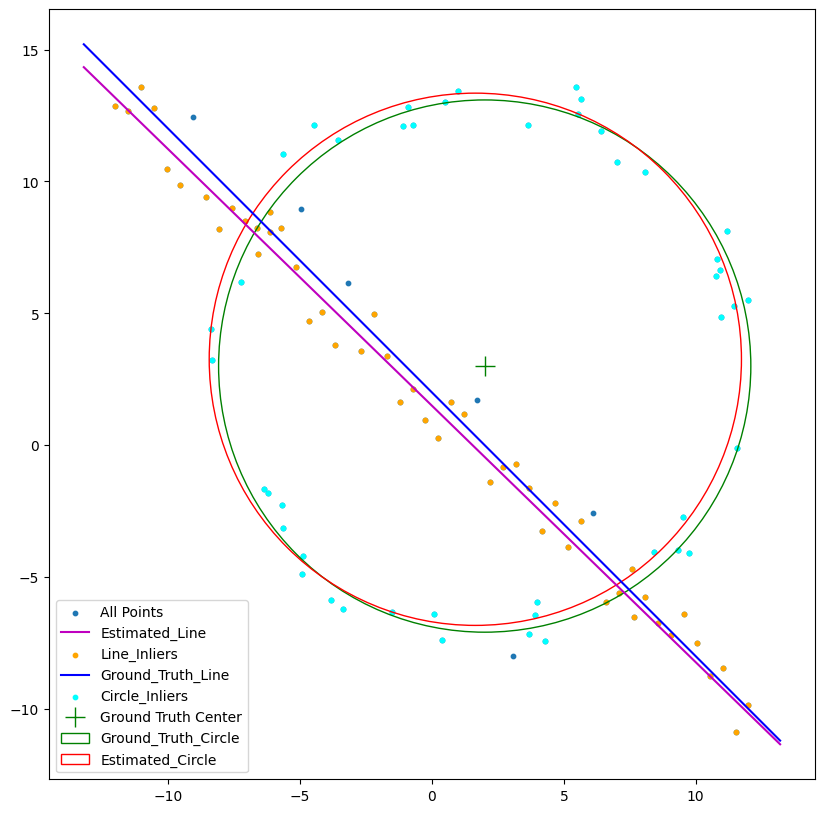

In [10]:
# Plot all in one graph
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
#plot all points
ax.scatter(X[:, 0], X[:, 1], label='All Points', s=10)  
#plotting the lines
x_min, x_max = ax.get_xlim()
x_ = np.array([x_min, x_max])
y_ = m * x_ + b
plt.plot(x_, y_, color='m', label='Estimated_Line')
ax.scatter(bestlinefits[:, 0], bestlinefits[:, 1], color='orange', s=10, label='Line_Inliers')
y_gt = -1*x_ + 2
plt.plot(x_, y_gt, color='b', label='Ground_Truth_Line')
ax.scatter(c_inliers[best_idx][:, 0], c_inliers[best_idx][:, 1], color='cyan', s=10, label='Circle_Inliers')

#Plotting the Circles
ax.plot(x0_gt, y0_gt, '+', color='g', markersize=15, label='Ground Truth Center')
circle_gt = plt.Circle((x0_gt, y0_gt), r, color='green', fill=False, label='Ground_Truth_Circle')
ax.add_patch(circle_gt)
circle_est = plt.Circle((xc, yc), r, color='red', fill=False, label='Estimated_Circle')
ax.add_patch(circle_est)
ax.set_aspect('equal', adjustable='box')
plt.legend()
plt.show()

#### Part d.

If we choose to detect the circle first without selecting the line, there will be many points lying close to the line. In such cases, when we randomly select three points to fit a circle, the selected points may lie very close to the line rather than forming a true circular boundary. As a result, we would need to perform many more iterations to identify proper points that accurately define the circle.

### Question 3

Marked : (398, 139)
Marked : (806, 46)
Marked : (816, 499)
Marked : (393, 463)
Selected Coordinates: [(398, 139), (806, 46), (816, 499), (393, 463)]


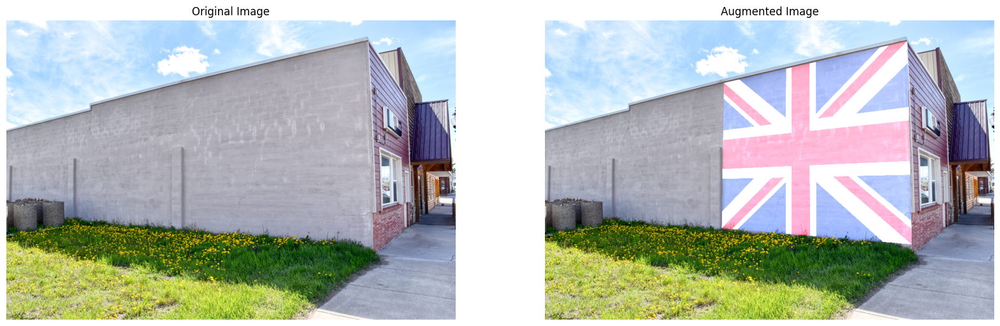

In [11]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

coordinates=[]
# Mouse callback function
def show_coordinates(event, x, y, flags, param):
    if event == cv2.EVENT_LBUTTONDOWN:  # when left button is clicked
        if len(coordinates) < 4:  # Limit to four points
            coordinates.append((x, y))
            print(f"Marked : ({x}, {y})")
    if event == cv2.EVENT_RBUTTONDOWN:  # when right button is clicked
        if len(coordinates) !=0:  # Limit to four points
            val=coordinates.pop()  # Remove last point
            print(f"Removed: {val}")

# Load image
img = cv2.imread('images/wall.jpg')
img2 = cv2.imread('images/UK.png')  

# Create resizable window
cv2.namedWindow('Image', cv2.WINDOW_NORMAL)

# Bind mouse callback
cv2.setMouseCallback('Image', show_coordinates)

temp_img = img.copy()
while True:
    cv2.imshow('Image', temp_img)
    #add a text into the image
    cv2.putText(temp_img, 'Four Left clicks to get the 4 coordinates', (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 0), 2)
    cv2.putText(temp_img, 'Right click to remove last point', (10, 70), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 0), 2)
    cv2.putText(temp_img, 'Press ESC to exit', (10, 110), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 0), 2)
    key = cv2.waitKey(1) & 0xFF
    if key == 27:  # ESC to quit
        break
cv2.waitKey(0)
cv2.destroyAllWindows()

#need to fit the uk image to those pints
print("Selected Coordinates:", coordinates)


# Convert coordinates to numpy array
pts_dst = np.array(coordinates, dtype=np.float32)

h, w = img2.shape[:2]

pts_src = np.array([[0,0], [w,0], [w,h], [0,h]], dtype=np.float32)

H, _ = cv2.findHomography(pts_src, pts_dst)

warped_flag = cv2.warpPerspective(img2, H, (img.shape[1], img.shape[0]))

# Create a mask where the warped flag exists
mask = (warped_flag > 0).astype(np.uint8)

# Simple blending
blended = cv2.addWeighted(img, 1, warped_flag, 0.7, 0)

#visualize in matplotlib
fig, ax = plt.subplots(1, 2, figsize=(20, 10))

ax[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
ax[0].set_title("Original Image")
ax[0].axis("off")

ax[1].imshow(cv2.cvtColor(blended, cv2.COLOR_BGR2RGB))
ax[1].set_title("Augmented Image")
ax[1].axis("off")
plt.show()


Marked : (119, 52)
Marked : (308, 110)
Marked : (335, 386)
Marked : (41, 384)
Selected Coordinates: [(119, 52), (308, 110), (335, 386), (41, 384)]


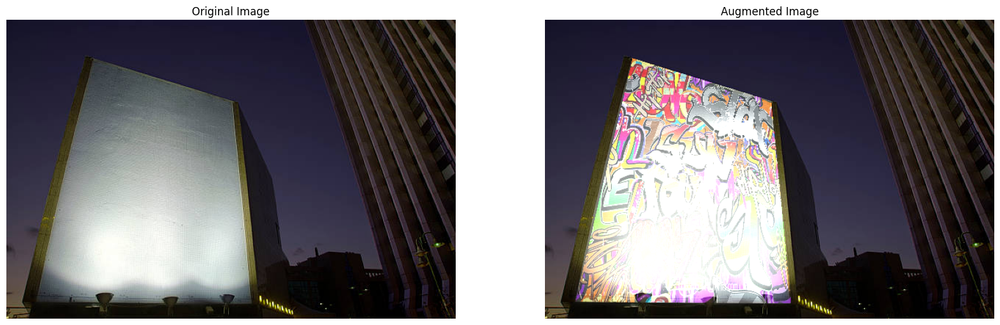

In [12]:
coordinates=[]
# Mouse callback function
def show_coordinates(event, x, y, flags, param):
    if event == cv2.EVENT_LBUTTONDOWN:  # when left button is clicked
        if len(coordinates) < 4:  # Limit to four points
            coordinates.append((x, y))
            print(f"Marked : ({x}, {y})")
    if event == cv2.EVENT_RBUTTONDOWN:  # when right button is clicked
        if len(coordinates) !=0:  # Limit to four points
            val=coordinates.pop()  # Remove last point
            print(f"Removed: {val}")

# Load image
img = cv2.imread('images/buld.jpg')
img2 = cv2.imread('images/graf.jpg')  

# Create resizable window
cv2.namedWindow('Image', cv2.WINDOW_NORMAL)

# Bind mouse callback
cv2.setMouseCallback('Image', show_coordinates)

temp_img = img.copy()
while True:
    cv2.imshow('Image', temp_img)
    #add a text into the image
    cv2.putText(temp_img, 'Four Left clicks to get the 4 coordinates', (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 0), 2)
    cv2.putText(temp_img, 'Right click to remove last point', (10, 70), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 0), 2)
    cv2.putText(temp_img, 'Press ESC to exit', (10, 110), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 0), 2)
    key = cv2.waitKey(1) & 0xFF
    if key == 27:  # ESC to quit
        break
cv2.waitKey(0)
cv2.destroyAllWindows()

#need to fit the uk image to those pints
print("Selected Coordinates:", coordinates)


# Convert coordinates to numpy array
pts_dst = np.array(coordinates, dtype=np.float32)

h, w = img2.shape[:2]

pts_src = np.array([[0,0], [w,0], [w,h], [0,h]], dtype=np.float32)

H, _ = cv2.findHomography(pts_src, pts_dst)

warped_flag = cv2.warpPerspective(img2, H, (img.shape[1], img.shape[0]))

# Create a mask where the warped flag exists
mask = (warped_flag > 0).astype(np.uint8)

# Simple blending
blended = cv2.addWeighted(img, 1, warped_flag, 0.7, 0)

#visualize in matplotlib
fig, ax = plt.subplots(1, 2, figsize=(20, 10))

ax[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
ax[0].set_title("Original Image")
ax[0].axis("off")

ax[1].imshow(cv2.cvtColor(blended, cv2.COLOR_BGR2RGB))
ax[1].set_title("Augmented Image")
ax[1].axis("off")
plt.show()


I chose an image of a building as the architectural image because I wanted to visualize how a flag would appear on the building. For the second example, I selected an image of a large wall so that I could overlay a graffiti image and see how it would look in real life. These choices were made to clearly demonstrate the effect of superimposing images on flat surfaces in realistic scenes.

### Question 4


Found 6 .ppm images.


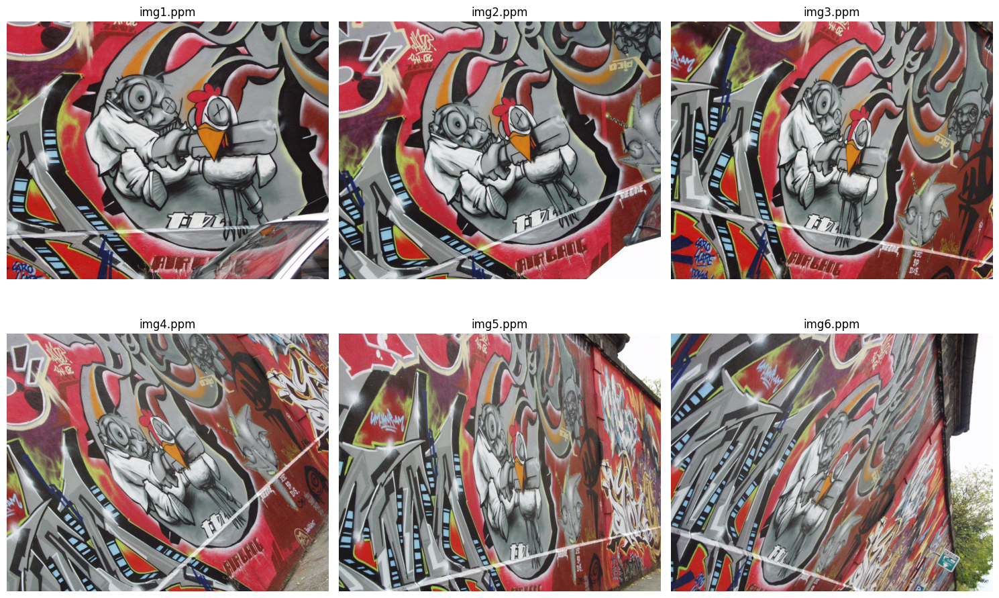

In [13]:
import cv2
import matplotlib.pyplot as plt
import glob
import os

# Path to your images
folder_path = r'graf/graf'  # adjust if needed

# Get all .ppm files
image_paths = sorted(glob.glob(os.path.join(folder_path, '*.ppm')))

# Print how many found
print(f"Found {len(image_paths)} .ppm images.")

# Set up figure
plt.figure(figsize=(15, 10))

# Plot each image
for i, img_path in enumerate(image_paths):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR → RGB for matplotlib
    plt.subplot(2, (len(image_paths) + 1)//2, i + 1)
    plt.imshow(img)
    plt.title(os.path.basename(img_path))
    plt.axis('off')

plt.tight_layout()
plt.show()


#### Part a.

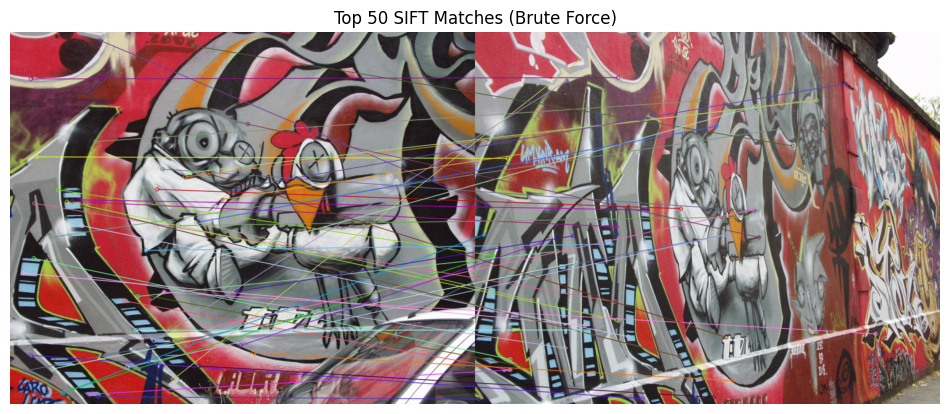

In [14]:
import cv2
import matplotlib.pyplot as plt

img1_color = cv2.imread('graf/graf/img1.ppm')
img2_color = cv2.imread('graf/graf/img5.ppm')

img1_gray = cv2.cvtColor(img1_color, cv2.COLOR_BGR2GRAY)
img2_gray = cv2.cvtColor(img2_color, cv2.COLOR_BGR2GRAY)

sift = cv2.SIFT_create()

kp1, des1 = sift.detectAndCompute(img1_gray, None)
kp2, des2 = sift.detectAndCompute(img2_gray, None)

# --- Brute-Force Matcher (for SIFT use L2) ---
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)
matches = bf.knnMatch(des1, des2, k=2)


good_matches = []  
for m_n in matches: #where m_n is a list of two matches
    if len(m_n) != 2:
        continue 
    m, n = m_n
    if m.distance < 0.75 * n.distance:
        good_matches.append(m)

# Draw top 50 matches
matched_img = cv2.drawMatches(
    img1_color, kp1, img2_color, kp2, good_matches[:50], None,
    flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
)

# Show matches
plt.figure(figsize=(12, 6))
plt.imshow(cv2.cvtColor(matched_img, cv2.COLOR_BGR2RGB))
plt.title(f"Top {min(50, len(good_matches))} SIFT Matches (Brute Force)")
plt.axis('off')
plt.show()


In [15]:
import numpy as np
import cv2

num_points = 4
thres = 4.0  # pixel threshold
iters = 2000
best_homography = None
best_inlier_count = 0
best_inliers = None

pts1, pts2 = matched_points_from_keypoints(kp1, kp2, good_matches)

for i in range(iters):
    # Randomly pick 4 matches
    idx = np.random.choice(len(pts1), num_points, replace=False)
    src_sample = pts1[idx]
    dst_sample = pts2[idx]

    try:
        H_try = homography_dlt(src_sample, dst_sample)
    except:
        continue

    # Compute reprojection distances
    src_h = np.hstack([pts1, np.ones((pts1.shape[0],1))])
    proj = (H_try @ src_h.T).T
    proj /= proj[:,2][:,None]
    dists = np.linalg.norm(proj[:,:2] - pts2, axis=1)
    inliers_mask = dists < thres
    num_inliers = np.sum(inliers_mask)

    # Keep best
    if num_inliers > best_inlier_count:
        best_inlier_count = num_inliers
        best_homography = H_try
        best_inliers = inliers_mask

# Refit H with all inliers
if best_inlier_count >= 4:
    best_homography = homography_dlt(pts1[best_inliers], pts2[best_inliers])

print(f"Best homography inliers: {best_inlier_count} / {len(pts1)}")
print("Best homography:\n", best_homography)


NameError: name 'matched_points_from_keypoints' is not defined